In [2]:
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
import os
import scanpy.external as sce
import matplotlib.pyplot as plt
import seaborn as sns

import warnings

# Suppress all warnings
warnings.filterwarnings("ignore")


%matplotlib inline

sns.set_style('ticks')
#matplotlib.rcParams['figure.figsize'] = [4, 4]
#matplotlib.rcParams['figure.dpi'] = 100


In [3]:
adata=ad.read_h5ad('/home/jan/R-projects/reheat2_pilot/data/celltype_data/Fibs/fibs_integrated_sub_reg.h5ad' )
#

#adata.obs_names_make_unique

adata.obs

In [ ]:
adata.obs

sc.tl.leiden(adata, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata, resolution = 0.5, key_added = "leiden_0.5")
sc.tl.leiden(adata, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(adata, resolution = 0.7, key_added = "leiden_0.7")
sc.tl.leiden(adata, resolution = 0.8, key_added = "leiden_0.8")

## explore QC on that cluster

leiden_0.4


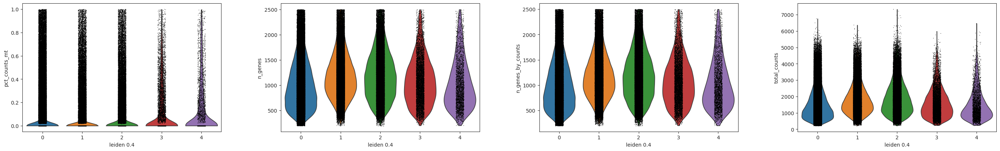

leiden_0.5


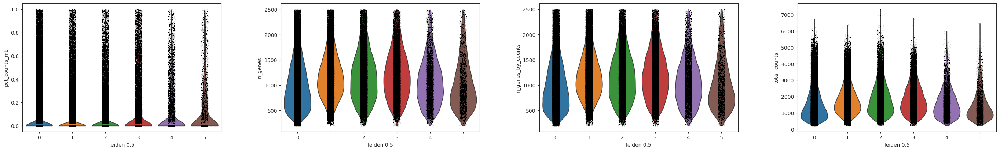

leiden_0.6


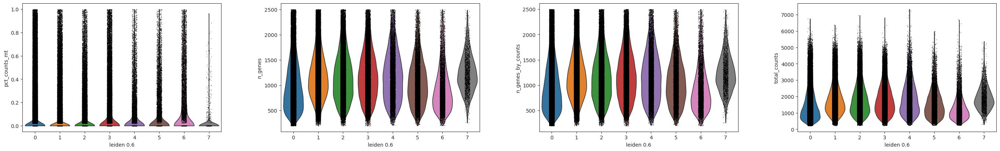

leiden_0.7


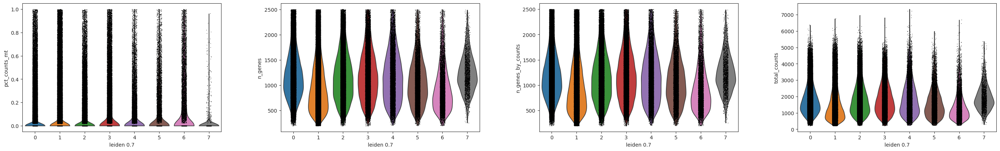

In [4]:
for i in range(4,8):
    res = "leiden_0." +str(i)
    
    print (res)
    sc.pl.violin(adata, ['pct_counts_mt', 'n_genes', "n_genes_by_counts", "total_counts"], groupby=res )

In [5]:
adata.obs
#sc.pl.violin(adata, ['pct_counts_mt', 'n_genes', "n_genes_by_counts", "total_counts"] groupby="leiden_0.7" )

,sample_id,cell_type,disease_code,heart_failure,batch,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden_0.4,leiden_0.5,leiden_0.6,leiden_0.7,leiden_0.8
TACACCCAGTTCCATG-1-0,P1622,Fib,NF,NF,Chaffin2022,2241,2240,3917.0,0.0,0.000000,0,0,0,1,1
CCACTTGGTGACACGA-1-0,P1622,Fib,NF,NF,Chaffin2022,2246,2246,3815.0,0.0,0.000000,0,0,0,1,4
ACTATGGAGTCACTGT-1-0,P1622,Fib,NF,NF,Chaffin2022,1957,1957,3711.0,0.0,0.000000,2,2,2,2,2
TCGAACACAGAGTAAT-1-0,P1622,Fib,NF,NF,Chaffin2022,2180,2180,3618.0,0.0,0.000000,2,2,2,2,2
ATGACCAAGACTTCAC-1-0,P1622,Fib,NF,NF,Chaffin2022,1984,1984,3564.0,0.0,0.000000,2,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CGGAATTTCCAAACCA-1-14,P1801,Fib,NF,NF,Simonson2023,536,535,628.0,3.0,0.477707,2,3,3,3,3
GTCATTTAGCGTCGAA-1-14,P1801,Fib,NF,NF,Simonson2023,537,537,626.0,1.0,0.159744,0,0,0,1,1
TGGGCTGCAGCTTCGG-1-14,P1801,Fib,NF,NF,Simonson2023,527,527,604.0,0.0,0.000000,0,0,0,1,1
GGTTAACGTTAGCGGA-1-14,P1801,Fib,NF,NF,Simonson2023,499,499,577.0,0.0,0.000000,0,0,0,1,1


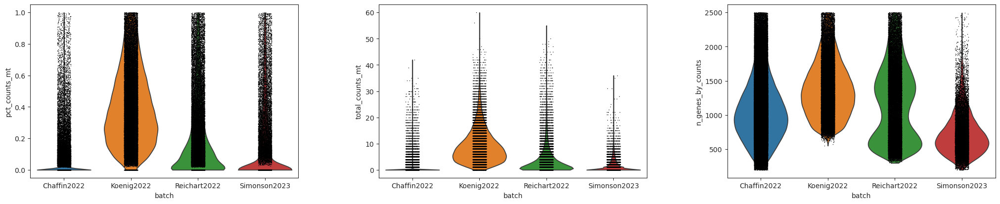

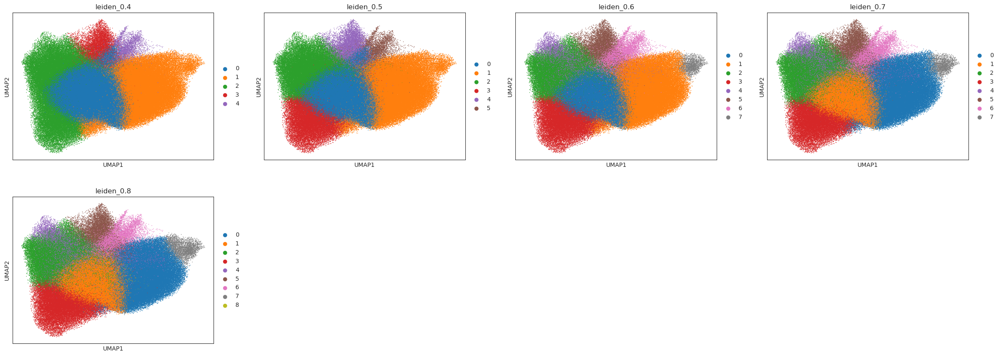

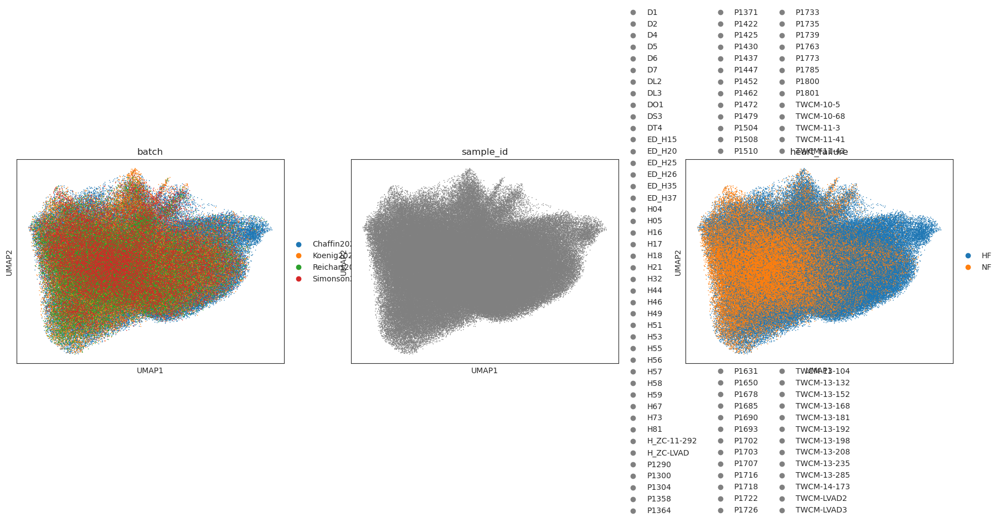

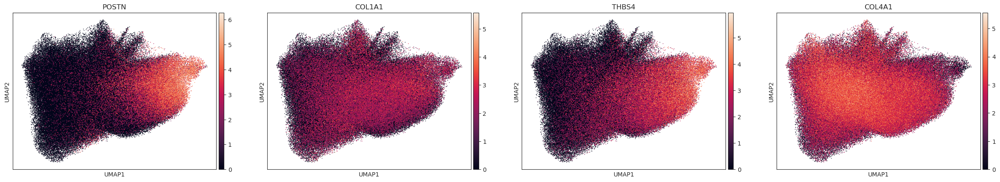

<Figure size 640x480 with 0 Axes>

In [6]:
#adata = adata[adata.obs.pct_counts_mt < 5, :]
sc.pl.violin(adata, ['pct_counts_mt', 'total_counts_mt', "n_genes_by_counts"], groupby='batch' )

sc.pl.umap(adata, color=['leiden_0.4', 'leiden_0.5', 'leiden_0.6','leiden_0.7', "leiden_0.8"], size = 5)

sc.pl.umap(adata, color=["batch", "sample_id", "heart_failure"], size = 5)

sc.pl.umap(adata, color=["POSTN", "COL1A1", "THBS4", "COL4A1"], size = 5)

plt.savefig("../../output/fib_sub_analysis/state_def_plots.pdf",  format='pdf')

In [47]:
sc.tl.rank_genes_groups(adata, 'leiden_0.5', method='wilcoxon')

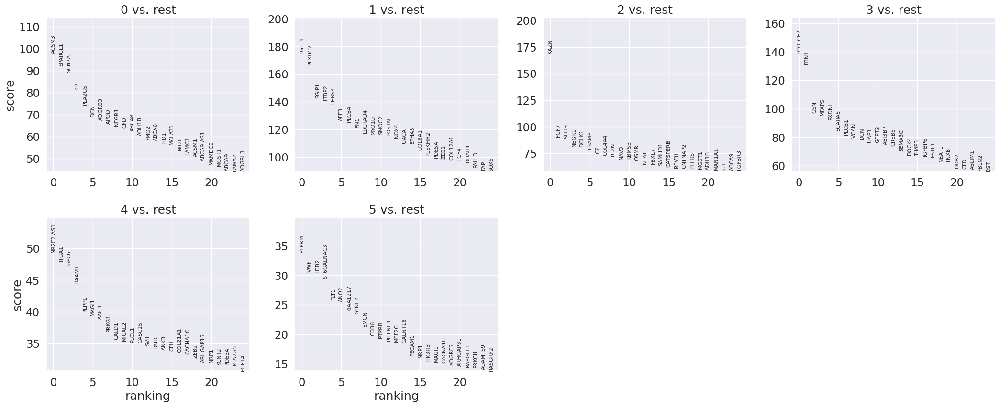

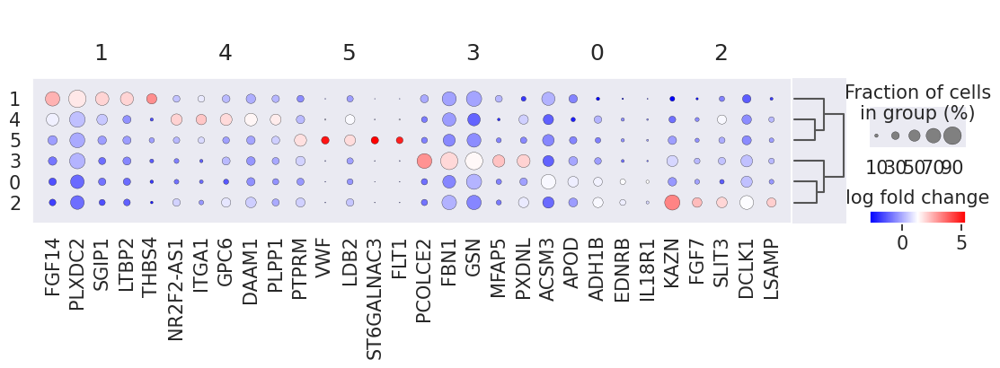

In [48]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=5,
    values_to_plot="logfoldchanges",
    min_logfoldchange=1,
    cmap="bwr",
)


Text(0.5, 1.0, 'Number of Unique Sample IDs per Cluster')

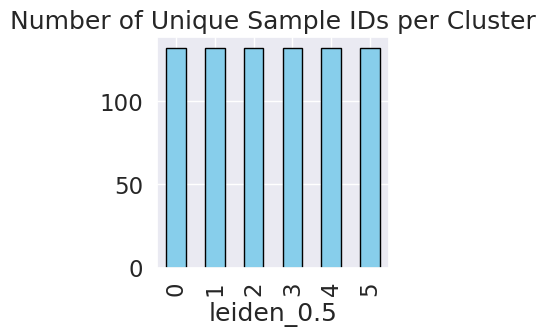

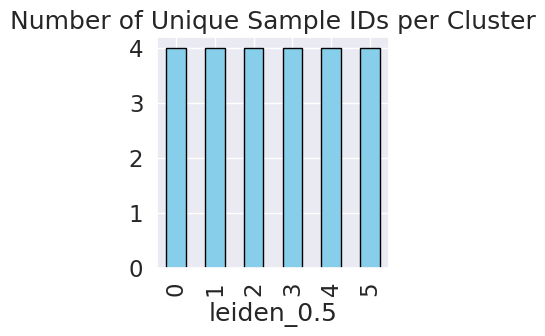

In [45]:


# Group by 'cluster' and calculate the number of unique 'sample_id' values
unique_samples_per_cluster = adata.obs.groupby('leiden_0.5')['sample_id'].nunique()
plt.figure(figsize=(3, 3))
unique_samples_per_cluster.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Number of Unique Sample IDs per Cluster')



In [49]:
lfc= pd.DataFrame(adata.uns['rank_genes_groups']["logfoldchanges"])
pval= pd.DataFrame(adata.uns['rank_genes_groups']["pvals"])

names= pd.DataFrame(adata.uns['rank_genes_groups']["names"])
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
df= pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals', "logfoldchanges"]})

df.to_csv("../../output/fib_sub_analysis/cluster_markers_leiden_0.5_filt.csv", index=False)


In [30]:
import seaborn as sns
sc.tl.dendrogram(adata, groupby = "leiden_0.5")
sns.set(font_scale=1.5)  # Set the font scale to increase the size

sc.tl.dendrogram(adata, groupby="leiden_0.5")


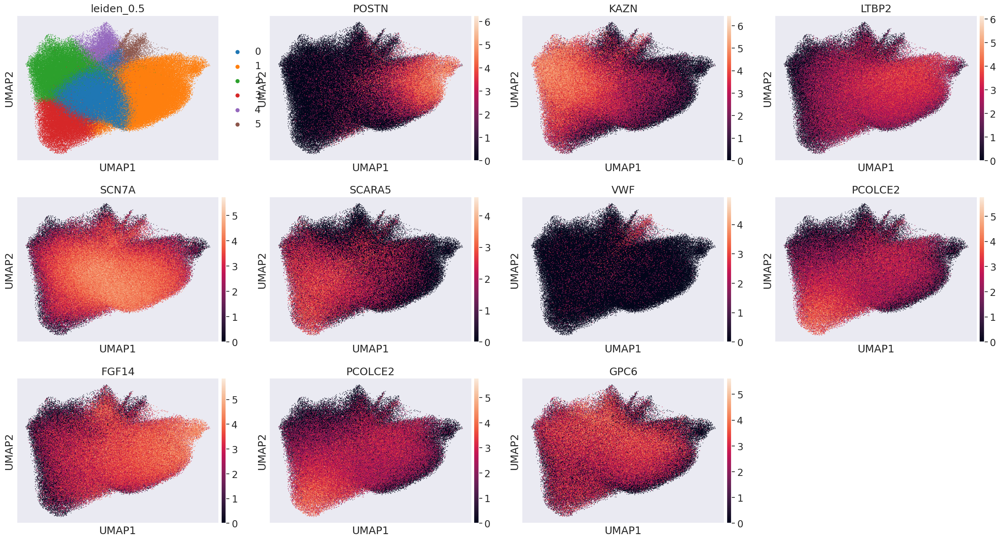

In [43]:

#leiden_umap = sc.pl.umap(adata, color=["leiden_0.8",'POSTN', "KAZN",  "LTBP2", "SCN7A","FGF14", "PCOLCE2", "DAAM1"],  size=5)
leiden_umap = sc.pl.umap(adata, color=["leiden_0.5",'POSTN', "KAZN",  "LTBP2", "SCN7A","SCARA5", "VWF", "PCOLCE2", "FGF14", "PCOLCE2", "GPC6"],  size=5)
#leiden_umap = sc.pl.umap(adata, color=["leiden_0.5",'POSTN', "KAZN",  "LTBP2", "NRG1","FGF14", "BMP4", "BMP6"],  size=5)
# Save the UMAP plot to a PDF
plt.savefig("feature_plots.pdf", format='pdf', bbox_inches='tight')

# Close the plot to avoid display if running in an interactive environment
plt.close()

In [32]:
adata.write('/home/jan/R-projects/reheat2_pilot/data/celltype_data/Fibs/fibs_integrated_sub_reg.h5ad' )

In [6]:
# save plots

custom_colors = ["#FFB200", "#E4003A", "#17BECF", "#B60071", "#1F77B4", "black"]

# Plot the UMAP with the custom colors
sc.pl.umap(adata, color='leiden_0.5', size=100, palette=custom_colors, show=False)

# Save the UMAP plot to a PDF
plt.savefig("umap_plot.pdf", format='pdf', bbox_inches='tight')

# Close the plot to avoid display if running in an interactive environment
plt.close()

In [11]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=10,
    values_to_plot="logfoldchanges",
    min_logfoldchange=1,
    cmap="bwr",show=False
)

# Save the dot plot to a PDF
plt.savefig("fib_marker_dotplot.pdf", format='pdf', bbox_inches='tight')

# Close the plot to avoid display if running in an interactive environment
plt.close()

In [13]:

sc.pl.umap(adata, color=['POSTN',"THBS4", #fib 1
                         "KAZN", "FGF7", #fib2
                         "PCOLCE2", "SCARA5", #fib 3
                         "COL4A1","ACE2", #fib0 
                           "GPC6", "ITGA1", 
                           "LDB2", "PTPRM"],  size=5, show=False)
plt.savefig("feature_plots.pdf", format='pdf', bbox_inches='tight')

plt.close()

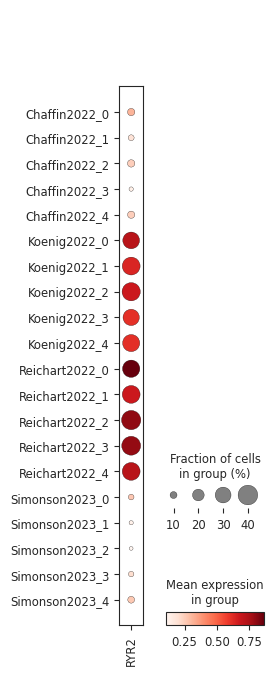

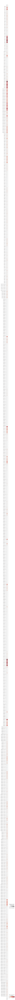

In [10]:

ax = sc.pl.dotplot(adata, "RYR2", groupby=['batch', "leiden_0.7"])
ax = sc.pl.dotplot(adata, "RYR2", groupby=['sample_id', "leiden_0.7"])

In [9]:
def calculate_proportions_from_andata(andata, cluster_col ):

    # Calucluate counts of cells and sample proportions:

    # 'sample_id' is the column in 'adata.obs' that represents the sample or batch ID
    # 'cluster' is the column in 'adata.obs' that represents the cluster labels

    # Group the data by both 'sample_id' and 'cluster' and count cells in each group
    sample_cluster_counts = adata.obs.groupby(['sample_id', cluster_col]).size()
   
    # Reset the index to have a DataFrame with 'sample_id', 'cluster', and cell counts
    sample_cluster_counts_df = sample_cluster_counts.reset_index(name='cell_count')

    # Pivot the table to have 'sample_id' as the index, 'cluster' as columns, and cell counts as values
    sample_cluster_counts_pivot = sample_cluster_counts_df.pivot(index='sample_id', columns=cluster_col, values='cell_count').fillna(0)

    # Calculate the proportions (percentages) for each cluster within each sample
    sample_cluster_proportions = sample_cluster_counts_pivot.div(sample_cluster_counts_pivot.sum(axis=1), axis=0) * 100

    # Display the sample-cluster counts and proportions
    print("Sample-Cluster Counts:")
    print(sample_cluster_counts_pivot)
    print("\nSample-Cluster Proportions (%):")
    print(sample_cluster_proportions)

    # Assuming 'sample_cluster_proportions' is the DataFrame containing cluster proportions per sample

    # Set the plotting style
    sns.set(style="whitegrid")

    # Create a boxplot
    plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
    sns.boxplot(data=sample_cluster_proportions, orient="h", palette="Set3")

    # Set axis labels and title
    plt.xlabel("Proportion (%)")
    plt.ylabel("Sample")
    plt.title("Cluster Proportions per Sample")

    # Show the plot
    plt.show()

    merged_df = pd.merge(sample_cluster_proportions, adata.obs[["sample_id", 'heart_failure', "batch"]].drop_duplicates(), on='sample_id')

    return(merged_df)




Sample-Cluster Counts:
leiden_0.5      0     1    2    3    4   5
sample_id                                 
D1            571   109  147  113    6  10
D2           1251   239  438  309   37  17
D4           1891   263  618  357   51  42
D5           1867   196  857  317   56  37
D6            390    17   56   52    7   5
...           ...   ...  ...  ...  ...  ..
TWCM-13-235   343   177  146   68   32   7
TWCM-13-285   255   298  167  149   18  15
TWCM-14-173   229    18  138   72    7   3
TWCM-LVAD2    261   506   98  202  140  11
TWCM-LVAD3    852  1395  449  501   51  40

[132 rows x 6 columns]

Sample-Cluster Proportions (%):
leiden_0.5           0          1          2          3          4         5
sample_id                                                                   
D1           59.728033  11.401674  15.376569  11.820084   0.627615  1.046025
D2           54.604976  10.432126  19.118289  13.487560   1.615015  0.742034
D4           58.690255   8.162632  19.180633  11.0800

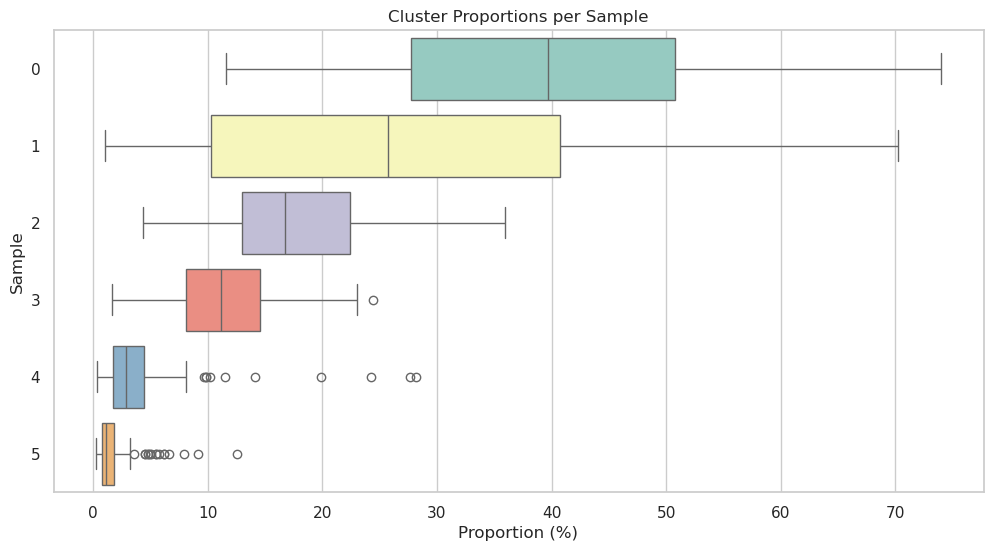

In [10]:
merged_df= calculate_proportions_from_andata(adata, "leiden_0.5")



Extract cell count per sample and cluster and save csv

In [11]:
cluster_col = 'leiden_0.5'
sample_cluster_counts = adata.obs.groupby(['sample_id', cluster_col, 'batch']).size()
   
# Reset the index to have a DataFrame with 'sample_id', 'cluster', and cell counts
sample_cluster_counts_df = sample_cluster_counts.reset_index(name='cell_count')
print(sample_cluster_counts_df)
# Pivot the table to have 'sample_id' as the index, 'cluster' as columns, and cell counts as values
#sample_cluster_counts_pivot = sample_cluster_counts_df.pivot(columns='sample_id', index=cluster_col, values='cell_count').fillna(0)

sample_cluster_counts_df.to_csv("../../output/fib_sub_analysis/cluster_counts_percluster_reg.csv", index=False)

       sample_id leiden_0.5         batch  cell_count
0             D1          0   Chaffin2022           0
1             D1          0    Koenig2022           0
2             D1          0  Reichart2022         571
3             D1          0  Simonson2023           0
4             D1          1   Chaffin2022           0
...          ...        ...           ...         ...
3163  TWCM-LVAD3          4  Simonson2023           0
3164  TWCM-LVAD3          5   Chaffin2022           0
3165  TWCM-LVAD3          5    Koenig2022          40
3166  TWCM-LVAD3          5  Reichart2022           0
3167  TWCM-LVAD3          5  Simonson2023           0

[3168 rows x 4 columns]


In [12]:

cluster_col = "leiden_0.5"
number_of_cluster = adata.obs[cluster_col].unique

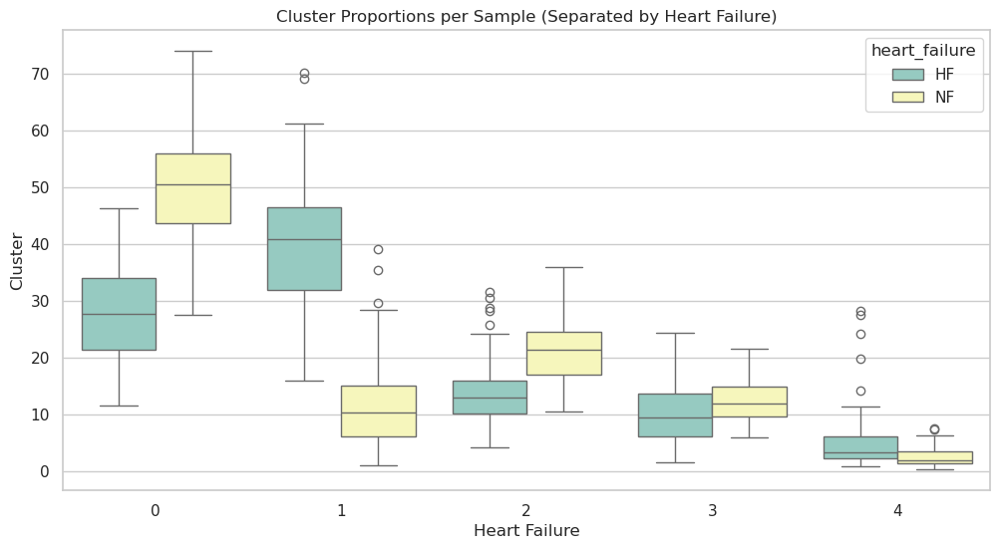

In [13]:
## plot 

columns_to_keep = [col for col in merged_df.columns if col not in ['0', '1', '2', '3', '4']]

# Pivot the columns '0' to '6' into a single 'value' column, keeping other columns intact
melted_df = pd.melt(merged_df, id_vars=columns_to_keep, value_vars=['0', '1', '2', '3', '4'], var_name='cluster', value_name='proportion')
melted_df


# Set the plotting style
sns.set(style="whitegrid")

# Create a boxplot separated by the 'heart_failure' variable
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
sns.boxplot(data=melted_df, y="proportion", x="cluster", hue = "heart_failure", palette="Set3")

# Set axis labels and title
plt.xlabel("Heart Failure")
plt.ylabel("Cluster")
plt.title("Cluster Proportions per Sample (Separated by Heart Failure)")

# Show the plot
plt.show()


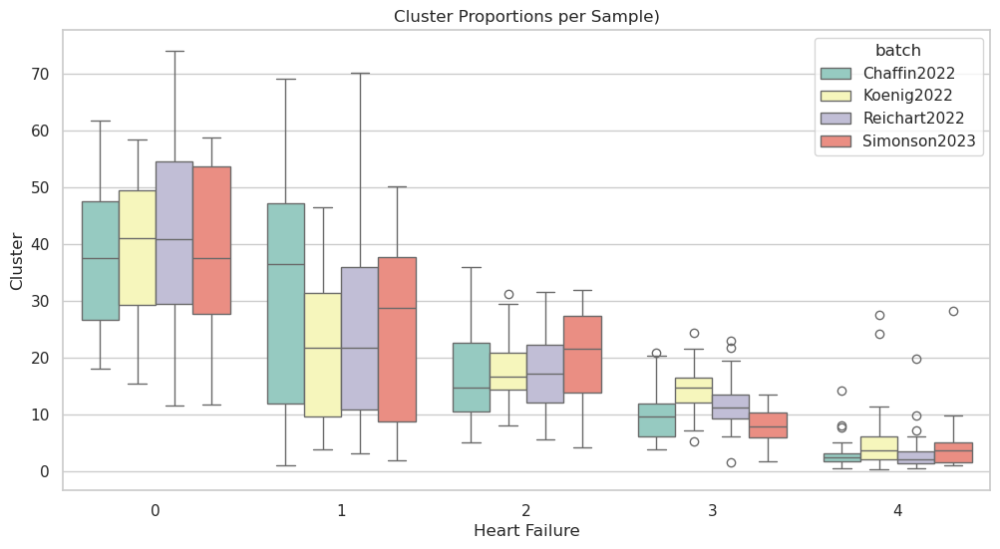

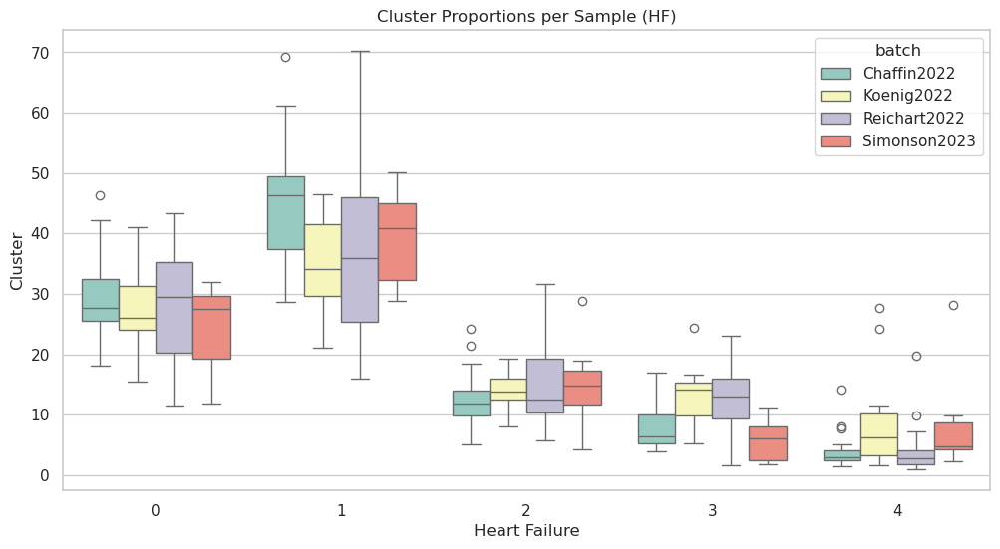

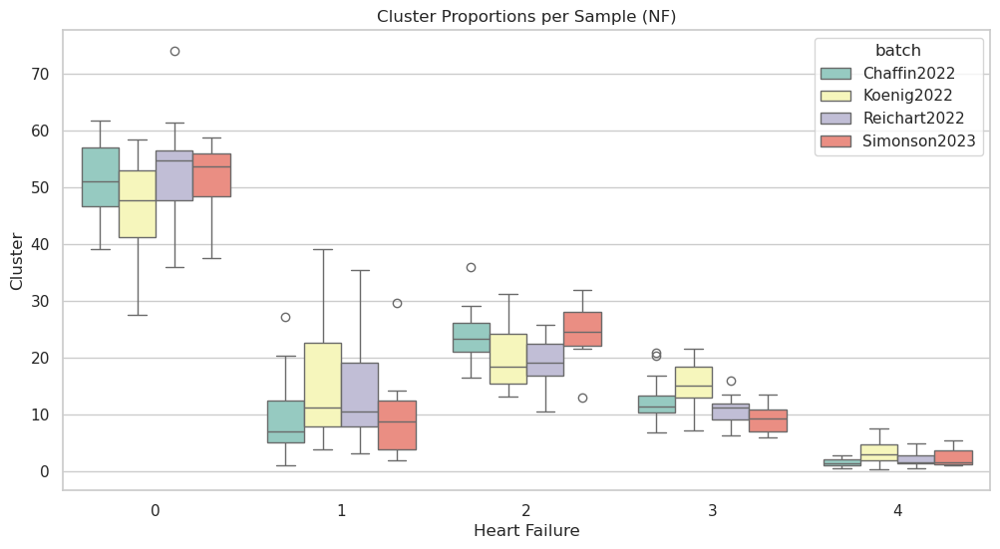

In [14]:
## plot 


columns_to_keep = [col for col in merged_df.columns if col not in ['0', '1', '2', '3', '4']]

# Pivot the columns '0' to '6' into a single 'value' column, keeping other columns intact
melted_df = pd.melt(merged_df, id_vars=columns_to_keep, value_vars=['0', '1', '2', '3', '4'], var_name='cluster', value_name='proportion')

filtered_hf = melted_df[melted_df['heart_failure'] == "HF"]
filtered_nf = melted_df[melted_df['heart_failure'] == "NF"]
# Set the plotting style
sns.set(style="whitegrid")




# Create a boxplot separated by the 'heart_failure' variable
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
sns.boxplot(data=melted_df, y="proportion", x="cluster", hue = "batch", palette="Set3")

# Set axis labels and title
plt.xlabel("Heart Failure")
plt.ylabel("Cluster")
plt.title("Cluster Proportions per Sample)")

# Show the plot
plt.show()


# Create a boxplot separated by the 'heart_failure' variable
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
sns.boxplot(data=filtered_hf, y="proportion", x="cluster", hue = "batch", palette="Set3")

# Set axis labels and title
plt.xlabel("Heart Failure")
plt.ylabel("Cluster")
plt.title("Cluster Proportions per Sample (HF)")

# Show the plot
plt.show()



# Create a boxplot separated by the 'heart_failure' variable
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
sns.boxplot(data=filtered_nf, y="proportion", x="cluster", hue = "batch", palette="Set3")

# Set axis labels and title
plt.xlabel("Heart Failure")
plt.ylabel("Cluster")
plt.title("Cluster Proportions per Sample (NF)")

# Show the plot
plt.show()



In [15]:

merged_df.to_csv('../../output/fib_sub_analysis/cluster_composition_sub.csv', index=False)
adata.obs.to_csv('../../output/fib_sub_analysis/obs_df_sub.csv', index=False)

In [18]:
## we can save the count data as a sparse matrix in mtx format
from scipy.io import mmwrite
cell_gene_matrix= adata.layers["counts"]
# Save the sparse matrix in Matrix Market format
mmwrite("cell_gene_matrix.mtx", cell_gene_matrix)

In [35]:
# process housekeeping genes for quick QC plots
# Download the file
#url = "https://raw.githubusercontent.com/Michorlab/tnbc_scrnaseq/master/data/housekeepers.txt"
#response = requests.get(url)

gene_names= pd.read_csv("/home/jan/Downloads/housekeepers.txt", sep="\t", header=None)

# Split the response text into lines to get the gene names

#print(gene_names)
# Filter the adata object to only include the genes of interest
gene_names_list = gene_names[gene_names.columns[0]].tolist()

# Convert var_names and gene_names_list to sets
var_names_set = set(adata.var_names)
gene_names_set = set(gene_names_list)

# Find the intersection
common_genes = var_names_set.intersection(gene_names_set)

# Convert the intersection back to a list
common_genes_list = list(common_genes)


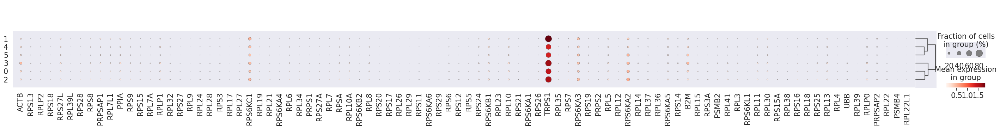

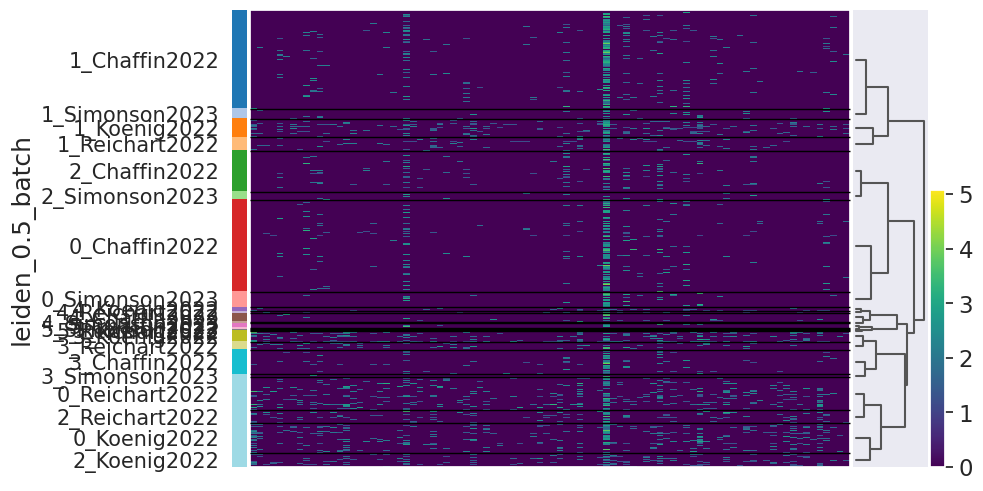

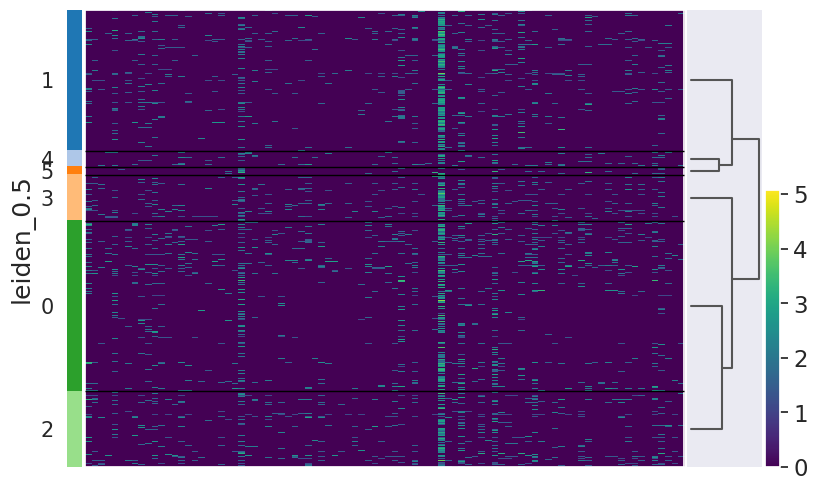

In [36]:
sc.pl.dotplot(adata, common_genes_list, 'leiden_0.5', dendrogram=True)
ax = sc.pl.heatmap(adata, common_genes_list, groupby=['leiden_0.5', 'batch'], cmap='viridis', dendrogram=True)
ax = sc.pl.heatmap(adata, common_genes_list, groupby=['leiden_0.5'], cmap='viridis', dendrogram=True)


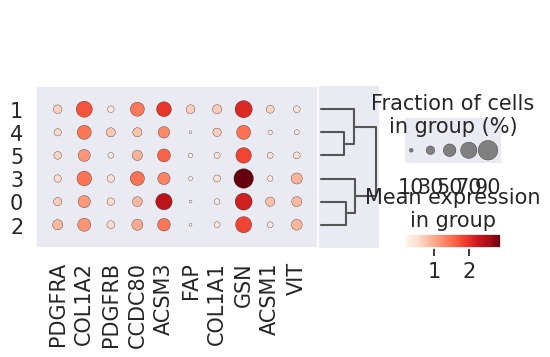

In [38]:
#Plot the expression of the top fibroblast marker genes in each cluster

fib_marker = ['COL1A1', "PDGFRB", 'PDGFRA', 'GSN', "FSP1", "FAP", "CCDC80", "VIT", "COL1A2", "ACSM1", "ACSM3"]
# Convert var_names and gene_names_list to sets
var_names_set = set(adata.var_names)
gene_names_set = set(fib_marker)

# Find the intersection
common_genes = list(var_names_set.intersection(gene_names_set))

sc.pl.dotplot(adata, common_genes, 'leiden_0.5', dendrogram=True)


In [117]:
adata_filtered1 = adata[adata.obs['leiden_0.5'].isin(['1', '3', '0']), :]
sc.tl.rank_genes_groups(adata_filtered1, 'leiden_0.7', method='t-test',key_added="rank_genes_groups_1_3_0")


In [119]:

adata_filtered2= adata[adata.obs['leiden_0.7'].isin(["4", "2", "0"]), :]
sc.tl.rank_genes_groups(adata_filtered2, 'leiden_0.7',groups=["4", "2", "0"], method='t-test',key_added="rank_genes_groups_4_2_0")

In [118]:
adata_filtered1

AnnData object with n_obs × n_vars = 166956 × 14748
    obs: 'sample_id', 'cell_type', 'disease_code', 'heart_failure', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8'
    uns: 'batch_colors', 'dendrogram_leiden_0.7', 'heart_failure_colors', 'leiden', 'leiden_0.4_colors', 'leiden_0.5_colors', 'leiden_0.6_colors', 'leiden_0.7_colors', 'leiden_0.8_colors', 'neighbors', 'rank_genes_groups', 'sample_id_colors', 'umap', 'dendrogram_leiden_0.7_batch', 'rank_genes_groups_1_3_0', 'rank_genes_groups_4_2_0'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [113]:
def extract_marker_gene_df(adata, key):
    lfc= pd.DataFrame(adata.uns[key]["logfoldchanges"])
    pval= pd.DataFrame(adata.uns[key]["pvals"])
    names= pd.DataFrame(adata.uns[key]["names"])
    result = adata.uns[key]
    groups = result['names'].dtype.names
    df= pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names', 'pvals', "logfoldchanges"]})
    return df




In [120]:
df1= extract_marker_gene_df(adata_filtered1, "rank_genes_groups_1_3_0")
#print(df1)
df1.to_csv("../../output/fib_sub_analysis/cluster_marker_group1.csv", index=False)

df2= extract_marker_gene_df(adata_filtered1, "rank_genes_groups_4_2_0")
print(df2)
df2.to_csv("../../output/fib_sub_analysis/cluster_marker_group2.csv", index=False)

           4_n  4_p       4_l     2_n  2_p       2_l     0_n            0_p  \
0         FBN1  0.0  2.308917    KAZN  0.0  3.600967  LINGO1  1.210478e-212   
1      PCOLCE2  0.0  3.378109      C7  0.0  1.562386    RYR2  4.360740e-176   
2        MFAP5  0.0  2.470511   NEGR1  0.0  1.174507    LRP4  1.653587e-135   
3          GSN  0.0  1.574508   DCLK1  0.0  1.665186    APOD  8.860786e-114   
4         VCAN  0.0  1.897130  COL4A4  0.0  1.517458  MALAT1   2.705192e-91   
...        ...  ...       ...     ...  ...       ...     ...            ...   
14743    PDGFD  0.0 -1.314249   SGIP1  0.0 -1.694517    EXT1   0.000000e+00   
14744    POSTN  0.0 -2.129207    TLL2  0.0 -2.329635  COL8A1   0.000000e+00   
14745       C7  0.0 -1.357360   FGF14  0.0 -1.891846    FBN1   0.000000e+00   
14746    SMOC2  0.0 -1.507286   THBS4  0.0 -2.554587  ABI3BP   0.000000e+00   
14747     FMO2  0.0 -1.615520   POSTN  0.0 -3.571405    NOX4   0.000000e+00   

            0_l  
0      0.922501  
1      0.538287

In [ ]:
df= sc.tl.rank_genes_groups(adata, 'leiden_0.7',groups=["4", "2", "0"], method='wilcoxon')
